In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

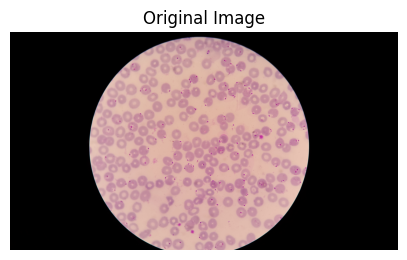

In [3]:
#test image for manual inspection
test_image_path = os.path.join('NIH-NLM-ThinBloodSmearsPf', 'Polygon Set', 
                                   '209C68P29N_ThinF', 'Img', 'IMG_20150819_133236.jpg')

bgr = cv2.imread(test_image_path)
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5, 5))
plt.imshow(rgb)
plt.title("Original Image")
plt.axis('off')
plt.show()

# Color Space and Filters Investigation

## Filters

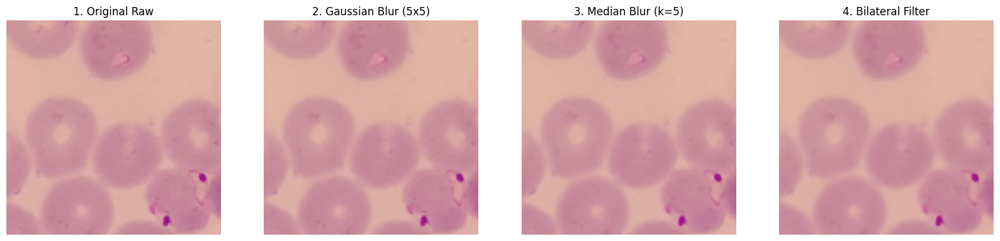

In [ ]:

rgb_gauss = cv2.GaussianBlur(rgb, (5, 5), 0)

#Median Blur
rgb_median = cv2.medianBlur(rgb, 5)

#Bilateral Filter (Texture smoothing)
rgb_bilateral = cv2.bilateralFilter(rgb, 9, 75, 75)

# Zoom Region Selection
h, w, _ = rgb.shape
y1, y2 = h//2 - 200, h//2 + 200
x1, x2 = w//2 - 200, w//2 + 200

fig, ax = plt.subplots(1, 4, figsize=(20, 6))
ax[0].imshow(rgb[y1:y2, x1:x2])
ax[0].set_title("1. Original Raw")

# Gaussian
ax[1].imshow(rgb_gauss[y1:y2, x1:x2])
ax[1].set_title("2. Gaussian Blur (5x5)")

# Median
ax[2].imshow(rgb_median[y1:y2, x1:x2])
ax[2].set_title("3. Median Blur (k=5)")

# Bilateral
ax[3].imshow(rgb_bilateral[y1:y2, x1:x2])
ax[3].set_title("4. Bilateral Filter")

for a in ax: a.axis('off')
plt.show()

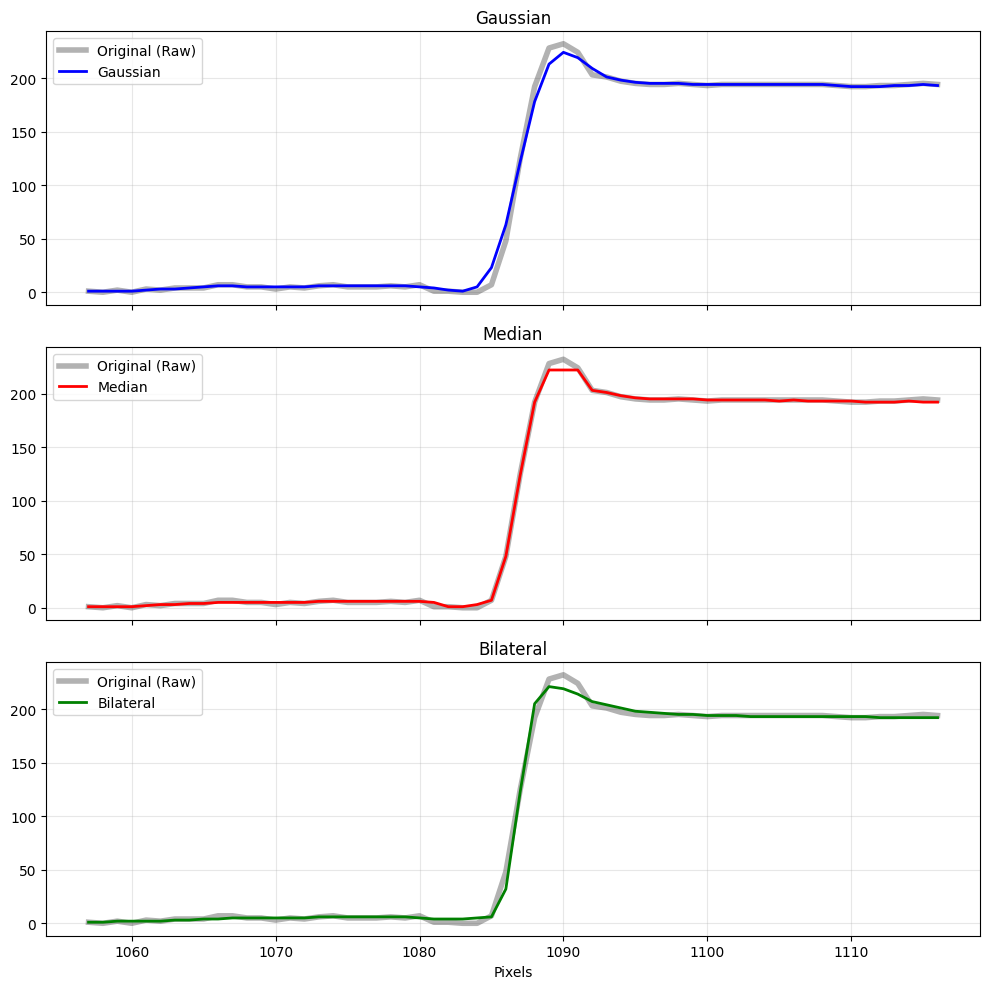

In [68]:
h, w, _ = rgb.shape
y_coord = h // 2 

sig_raw = rgb[y_coord, :, 1]
sig_gauss = rgb_gauss[y_coord, :, 1]
sig_med = rgb_median[y_coord, :, 1]
sig_bilat = rgb_bilateral[y_coord, :, 1]

gradient = np.abs(np.gradient(sig_raw))
edge_idx = np.argmax(gradient)

zoom_win = 30
x_start = max(0, edge_idx - zoom_win)
x_end = min(w, edge_idx + zoom_win)
x_axis = range(x_start, x_end)

fig, ax = plt.subplots(3, 1, figsize=(10, 10), sharex=True)

ax[0].plot(x_axis, sig_raw[x_start:x_end], 'k-', alpha=0.3, linewidth=4, label='Original (Raw)')
ax[0].plot(x_axis, sig_gauss[x_start:x_end], 'b-', linewidth=2, label='Gaussian')
ax[0].set_title("Gaussian")
ax[0].legend()
ax[0].grid(True, alpha=0.3)

ax[1].plot(x_axis, sig_raw[x_start:x_end], 'k-', alpha=0.3, linewidth=4, label='Original (Raw)')
ax[1].plot(x_axis, sig_med[x_start:x_end], 'r-', linewidth=2, label='Median')
ax[1].set_title("Median")
ax[1].legend()
ax[1].grid(True, alpha=0.3)

ax[2].plot(x_axis, sig_raw[x_start:x_end], 'k-', alpha=0.3, linewidth=4, label='Original (Raw)')
ax[2].plot(x_axis, sig_bilat[x_start:x_end], 'g-', linewidth=2, label='Bilateral')
ax[2].set_title("Bilateral")
ax[2].legend()
ax[2].grid(True, alpha=0.3)

plt.xlabel("Pixels")
plt.tight_layout()
plt.show()

## Color Space

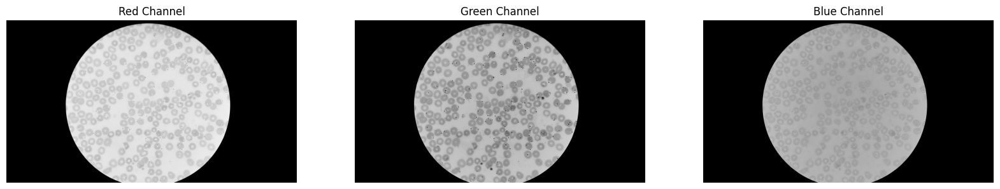

In [16]:
r, g, b = cv2.split(rgb)
fig, ax = plt.subplots(1, 3, figsize=(20, 6))

ax[0].imshow(r, cmap='gray')
ax[0].set_title("Red Channel")

ax[1].imshow(g, cmap='gray')
ax[1].set_title("Green Channel")

ax[2].imshow(b, cmap='gray')
ax[2].set_title("Blue Channel")

for a in ax: a.axis('off')
plt.show()

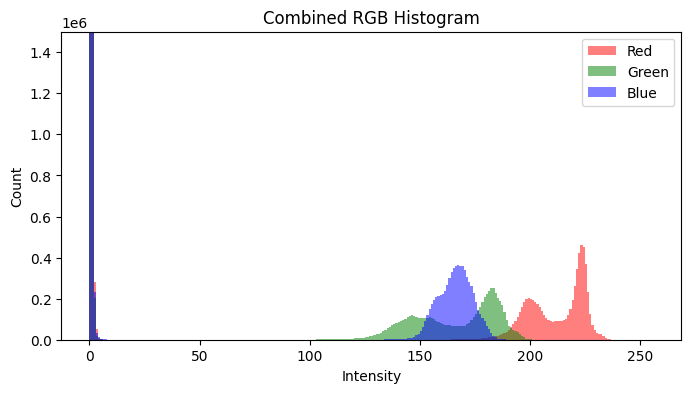

In [27]:
plt.figure(figsize=(8, 4))

plt.hist(r.ravel(), 256, range=[0, 256], color='red', alpha=0.5, label='Red')
plt.hist(g.ravel(), 256, range=[0, 256], color='green', alpha=0.5, label='Green')
plt.hist(b.ravel(), 256, range=[0, 256], color='blue', alpha=0.5, label='Blue')
plt.ylim(0,1.5e6)

plt.title("Combined RGB Histogram")
plt.xlabel("Intensity")
plt.ylabel("Count")
plt.legend()
plt.show()

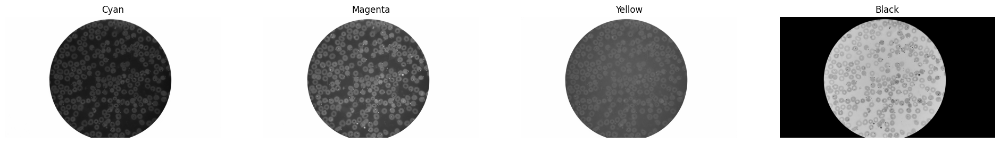

In [38]:
c = 255 - r
m = 255 - g
y = 255 - b
k = np.min(rgb, axis=2)

fig, ax = plt.subplots(1, 4, figsize=(24, 6))

ax[0].imshow(c, cmap='gray')
ax[0].set_title("Cyan")

ax[1].imshow(m, cmap='gray')
ax[1].set_title("Magenta")

ax[2].imshow(y, cmap='gray')
ax[2].set_title("Yellow")

ax[3].imshow(k, cmap='gray')
ax[3].set_title("Black")

for a in ax: a.axis('off')
plt.show()

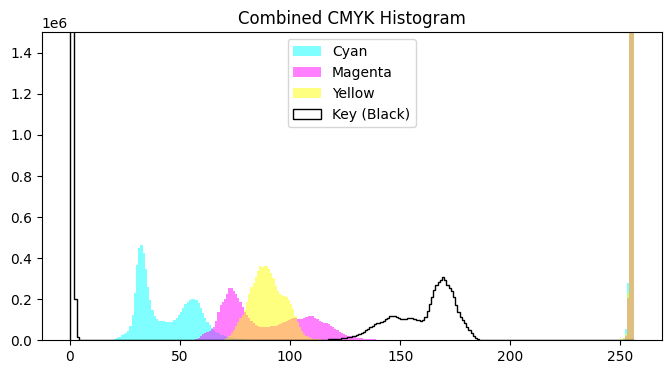

In [31]:
plt.figure(figsize=(8, 4))

plt.hist(c.ravel(), 256, range=[0, 256], color='cyan', alpha=0.5, label='Cyan')
plt.hist(m.ravel(), 256, range=[0, 256], color='magenta', alpha=0.5, label='Magenta')
plt.hist(y.ravel(), 256, range=[0, 256], color='yellow', alpha=0.5, label='Yellow')
plt.hist(k.ravel(), 256, range=[0, 256], color='black', histtype='step', label='Key (Black)')
plt.ylim(0,1.5e6)
plt.title("Combined CMYK Histogram")
plt.legend()
plt.show()

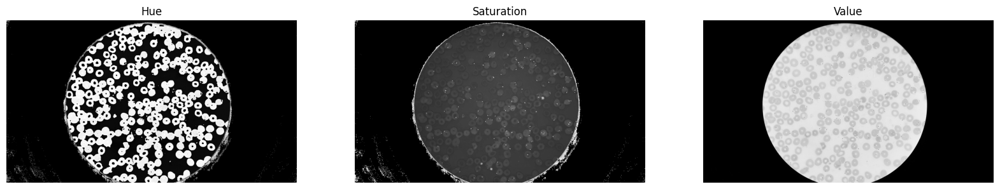

In [49]:
hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
h_ch, s_ch, v_ch = cv2.split(hsv)

fig, ax = plt.subplots(1, 3, figsize=(20, 6))

ax[0].imshow(h_ch, cmap='gray')
ax[0].set_title("Hue")

ax[1].imshow(s_ch, cmap='gray')
ax[1].set_title("Saturation")

ax[2].imshow(v_ch, cmap='gray')
ax[2].set_title("Value")

for a in ax: a.axis('off')
plt.show()

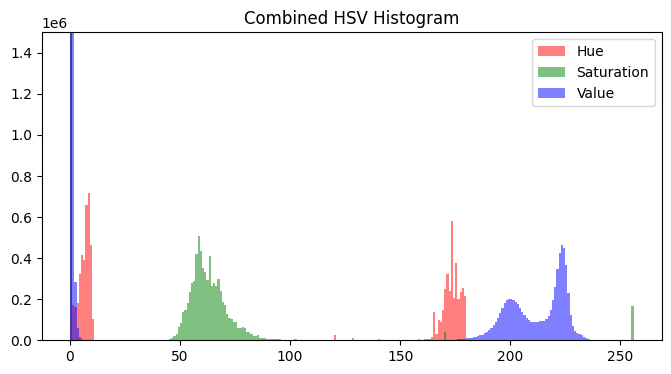

In [39]:
plt.figure(figsize=(8, 4))

plt.hist(h_ch.ravel(), 256, range=[0, 256], color='red', alpha=0.5, label='Hue')
plt.hist(s_ch.ravel(), 256, range=[0, 256], color='green', alpha=0.5, label='Saturation')
plt.hist(v_ch.ravel(), 256, range=[0, 256], color='blue', alpha=0.5, label='Value')
plt.ylim(0,1.5e6)

plt.title("Combined HSV Histogram")
plt.legend()
plt.show()

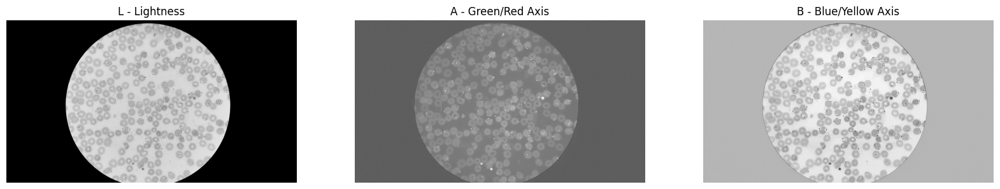

In [35]:
lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
l_ch, a_ch, b_ch = cv2.split(lab)

fig, ax = plt.subplots(1, 3, figsize=(20, 6))

ax[0].imshow(l_ch, cmap='gray')
ax[0].set_title("L - Lightness")

ax[1].imshow(a_ch, cmap='gray')
ax[1].set_title("A - Green/Red Axis")

ax[2].imshow(b_ch, cmap='gray')
ax[2].set_title("B - Blue/Yellow Axis")

for a in ax: a.axis('off')
plt.show()

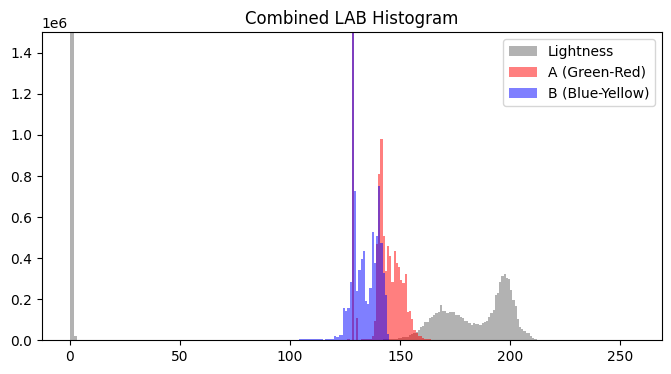

In [37]:
plt.figure(figsize=(8, 4))

plt.hist(l_ch.ravel(), 256, range=[0, 256], color='black', alpha=0.3, label='Lightness')
plt.hist(a_ch.ravel(), 256, range=[0, 256], color='red', alpha=0.5, label='A (Green-Red)')
plt.hist(b_ch.ravel(), 256, range=[0, 256], color='blue', alpha=0.5, label='B (Blue-Yellow)')
plt.ylim(0,1.5e6)
plt.title("Combined LAB Histogram")
plt.legend()
plt.show()

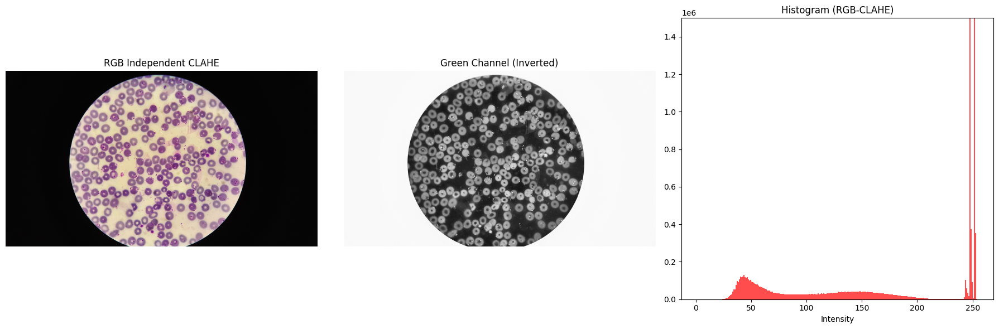

In [ ]:
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))

r_c = clahe.apply(rgb[:, :, 0])
g_c = clahe.apply(rgb[:, :, 1])
b_c = clahe.apply(rgb[:, :, 2])

rgb_clahe_all = cv2.merge((r_c, g_c, b_c))
feature_rgb_clahe = 255 - g_c  

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(rgb_clahe_all)
ax[0].set_title("RGB Independent CLAHE")
ax[0].axis('off')

ax[1].imshow(feature_rgb_clahe, cmap='gray')
ax[1].set_title("Green Channel (Inverted)")
ax[1].axis('off')

# Histogram
ax[2].hist(feature_rgb_clahe.ravel(), 256, range=[0, 256], color='red', alpha=0.7)
ax[2].set_title("Histogram (RGB-CLAHE)")
ax[2].set_xlabel("Intensity")
ax[2].set_ylim(0,1.5e6)

plt.tight_layout()
plt.show()

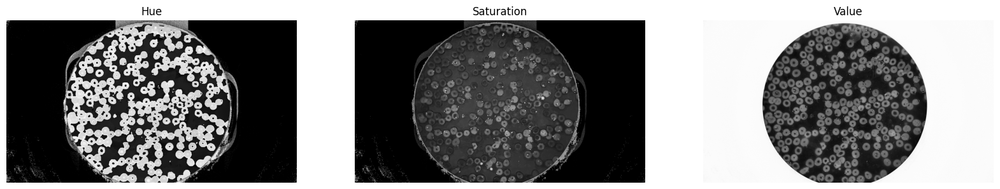

In [52]:
hsv = cv2.cvtColor(rgb_clahe_all, cv2.COLOR_RGB2HSV)
h_ch, s_ch, v_ch = cv2.split(hsv)

fig, ax = plt.subplots(1, 3, figsize=(20, 6))

ax[0].imshow(h_ch, cmap='gray')
ax[0].set_title("Hue")

ax[1].imshow(s_ch, cmap='gray')
ax[1].set_title("Saturation")

ax[2].imshow(255 - v_ch, cmap='gray')
ax[2].set_title("Value")

for a in ax: a.axis('off')
plt.show()

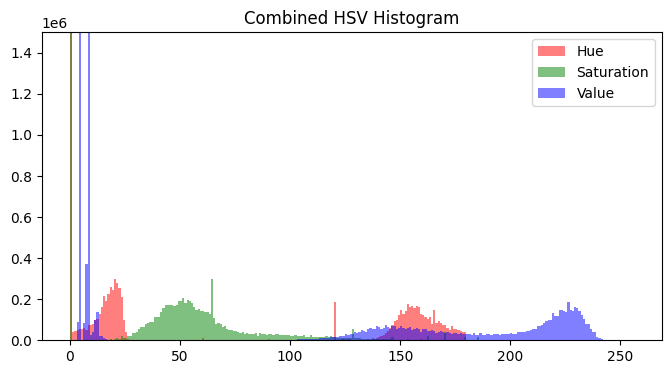

In [53]:
plt.figure(figsize=(8, 4))

plt.hist(h_ch.ravel(), 256, range=[0, 256], color='red', alpha=0.5, label='Hue')
plt.hist(s_ch.ravel(), 256, range=[0, 256], color='green', alpha=0.5, label='Saturation')
plt.hist(v_ch.ravel(), 256, range=[0, 256], color='blue', alpha=0.5, label='Value')
plt.ylim(0,1.5e6)

plt.title("Combined HSV Histogram")
plt.legend()
plt.show()

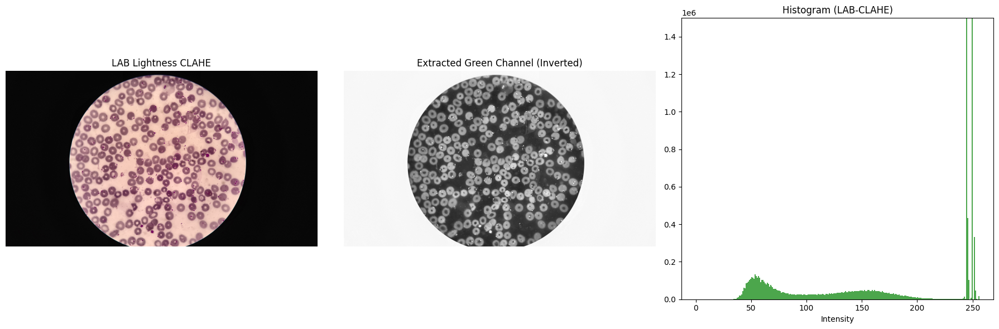

In [ ]:
lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)
l, a, b_ch = cv2.split(lab)

clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
l_enhanced = clahe.apply(l)

lab_enhanced = cv2.merge((l_enhanced, a, b_ch))
rgb_clahe_lab = cv2.cvtColor(lab_enhanced, cv2.COLOR_LAB2RGB)

feature_lab_clahe = 255 - rgb_clahe_lab[:, :, 1]

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(rgb_clahe_lab)
ax[0].set_title("LAB Lightness CLAHE")
ax[0].axis('off')

ax[1].imshow(feature_lab_clahe, cmap='gray')
ax[1].set_title("Extracted Green Channel (Inverted)")
ax[1].axis('off')

# Histogram
ax[2].hist(feature_lab_clahe.ravel(), 256, range=[0, 256], color='green', alpha=0.7)
ax[2].set_title("Histogram (LAB-CLAHE)")
ax[2].set_xlabel("Intensity")
ax[2].set_ylim(0,1.5e6)

plt.tight_layout()
plt.show()

# Final Choice of Channel

## Green Inverted after CLAHE

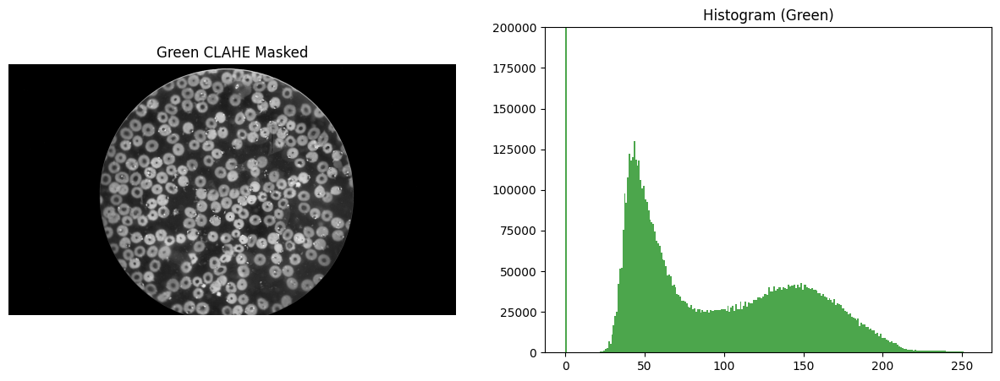

In [4]:
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
g_c = clahe.apply(rgb[:, :, 1])

green_inverted = 255 - g_c

gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
_, roi_mask = cv2.threshold(gray, 15, 255, cv2.THRESH_BINARY)

img_green = cv2.bitwise_and(green_inverted, green_inverted, mask=roi_mask)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

ax[0].imshow(img_green, cmap='gray')
ax[0].set_title("Green CLAHE Masked")
ax[0].axis('off')

ax[1].hist(img_green.ravel(), 256, range=[0, 256], color='green', alpha=0.7)
ax[1].set_title("Histogram (Green)")
ax[1].set_ylim(0, 0.2e6) 

plt.show()


## HUE

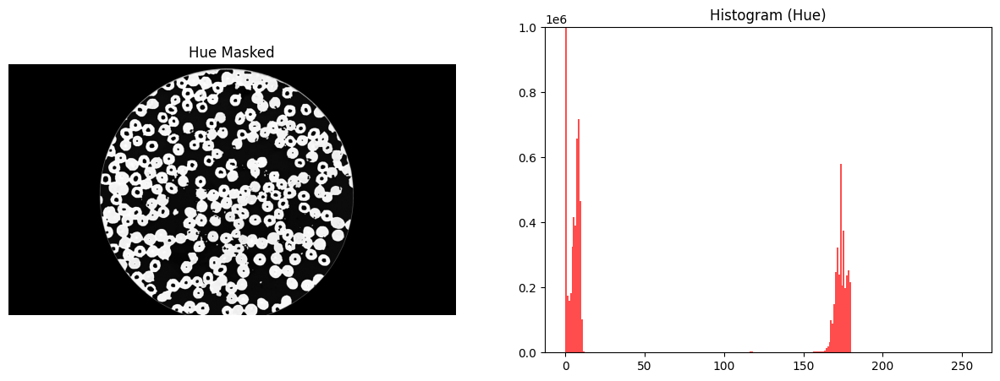

In [5]:
hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

_, v_mask = cv2.threshold(v, 30, 255, cv2.THRESH_BINARY)

img_hue = cv2.bitwise_and(h, h, mask=v_mask)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

ax[0].imshow(img_hue, cmap='gray')
ax[0].set_title("Hue Masked")
ax[0].axis('off')


ax[1].hist(img_hue.ravel(), 256, range=[0, 256], color='red', alpha=0.7)
ax[1].set_title("Histogram (Hue)")
ax[1].set_ylim(0, 1e6) 

plt.show()

# Segmentation Methods Comparing

In [6]:
gt_path = 'NIH-NLM-ThinBloodSmearsPf/Polygon Set/209C68P29N_ThinF/GT/IMG_20150819_133236.txt'
print(f"{int(open(gt_path).readline().split(',')[0])} GT points")

218 GT points


In [7]:
def overlay_blue_mask(img_rgb, mask, alpha=0.4):
    blue_layer = np.zeros_like(img_rgb)
    blue_layer[mask > 0] = [0, 0, 255]
    
    out = img_rgb.copy()
    roi = mask > 0
    if roi.any():
        out[roi] = cv2.addWeighted(img_rgb[roi], 1-alpha, blue_layer[roi], alpha, 0).squeeze()
    return out

def visualize_grid(img_input, img_rgb, method_func, params_list, title_main):
    n = len(params_list)
    cols = 4
    rows = (n + cols - 1) // cols
    actual_cols = min(n, cols)
    
    fig, axes = plt.subplots(rows, actual_cols, figsize=(4 * actual_cols, 5 * rows))
    
    if n == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    for i, params in enumerate(params_list):
        res_img, count = method_func(img_input, img_rgb, **params)
        param_str = "\n".join([f"{k}={v}" for k, v in params.items()])
        
        axes[i].imshow(res_img)
        axes[i].set_title(f"Obj: {count}\n{param_str}", fontsize=9)
        axes[i].axis('off')
        
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
        
    plt.suptitle(title_main, fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

In [8]:
def segment_otsu(img_gray, img_rgb_ref, blur_ksize=0, morph_kernel_size=0, min_area=50):
    if blur_ksize > 0:
        if blur_ksize % 2 == 0: blur_ksize += 1
        img_proc = cv2.GaussianBlur(img_gray, (blur_ksize, blur_ksize), 0)
    else:
        img_proc = img_gray

    _, binary = cv2.threshold(img_proc, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    if morph_kernel_size > 0:
        kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
        binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=1)
        binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)
    
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary)
    
    clean_mask = np.zeros_like(binary)
    valid_count = 0
    
    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]
        if area > min_area:
            clean_mask[labels == i] = 255
            valid_count += 1
            
    vis_img = overlay_blue_mask(img_rgb_ref, clean_mask, alpha=0.4)
    return vis_img, valid_count

def segment_watershed(img_gray, img_rgb_ref, blur_ksize=0, morph_kernel_size=3, dist_mask_size=5, dist_thresh_ratio=0.5, min_area=50):
    if blur_ksize > 0:
        if blur_ksize % 2 == 0: blur_ksize += 1
        img_proc = cv2.GaussianBlur(img_gray, (blur_ksize, blur_ksize), 0)
    else:
        img_proc = img_gray
        
    _, binary = cv2.threshold(img_proc, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    if morph_kernel_size > 0:
        kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
        closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=2)
        opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=2)
    else:
        opening = binary
        kernel = np.ones((3, 3), np.uint8)

    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, dist_mask_size)
    
    if dist_transform.max() == 0: return img_rgb_ref.copy(), 0
    
    _, sure_fg = cv2.threshold(dist_transform, dist_thresh_ratio * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    
    unknown = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0

    markers = cv2.watershed(img_rgb_ref, markers)
    
    unique, counts = np.unique(markers, return_counts=True)
    
    valid_labels = []
    for label, count in zip(unique, counts):
        if label > 1 and count > min_area:
            valid_labels.append(label)
            
    object_mask = np.isin(markers, valid_labels).astype(np.uint8) * 255
    
    vis_img = overlay_blue_mask(img_rgb_ref, object_mask, alpha=0.4)
    return vis_img, len(valid_labels)

def segment_hough(img_gray, img_rgb_ref, blur_ksize=5, dp=1.2, minDist=25, param1=50, param2=30, min_radius=15):
    if blur_ksize > 0 and blur_ksize % 2 == 0: blur_ksize += 1
        
    if blur_ksize > 0:
        blur = cv2.medianBlur(img_gray, blur_ksize)
    else:
        blur = img_gray
    
    circles = cv2.HoughCircles(
        blur, cv2.HOUGH_GRADIENT, dp=dp, minDist=minDist,
        param1=param1, param2=param2, minRadius=min_radius, maxRadius=80
    )
    
    vis_img = img_rgb_ref.copy()
    count = 0
    if circles is not None:
        circles = np.uint16(np.around(circles))
        count = circles.shape[1]
        for i in circles[0, :]:
            cv2.circle(vis_img, (i[0], i[1]), i[2], (0, 0, 255), 2)
            
    return vis_img, count

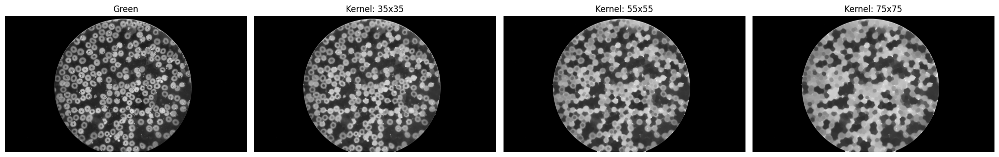

In [21]:
def gray_morphology(img_rgb):    
    kernel_sizes = [35, 55, 75]
    
    plt.figure(figsize=(20, 6))

    plt.subplot(1, 4, 1)
    plt.imshow(img_rgb, cmap='gray')
    plt.title("Green")
    plt.axis('off')
    
    for i, k_size in enumerate(kernel_sizes):
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k_size, k_size))
        closed = cv2.morphologyEx(img_rgb, cv2.MORPH_CLOSE, kernel)
        
        plt.subplot(1, 4, i + 2)
        plt.imshow(closed, cmap='gray')
        plt.title(f"Kernel: {k_size}x{k_size}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

gray_morphology(img_green)


## Watershed Grid

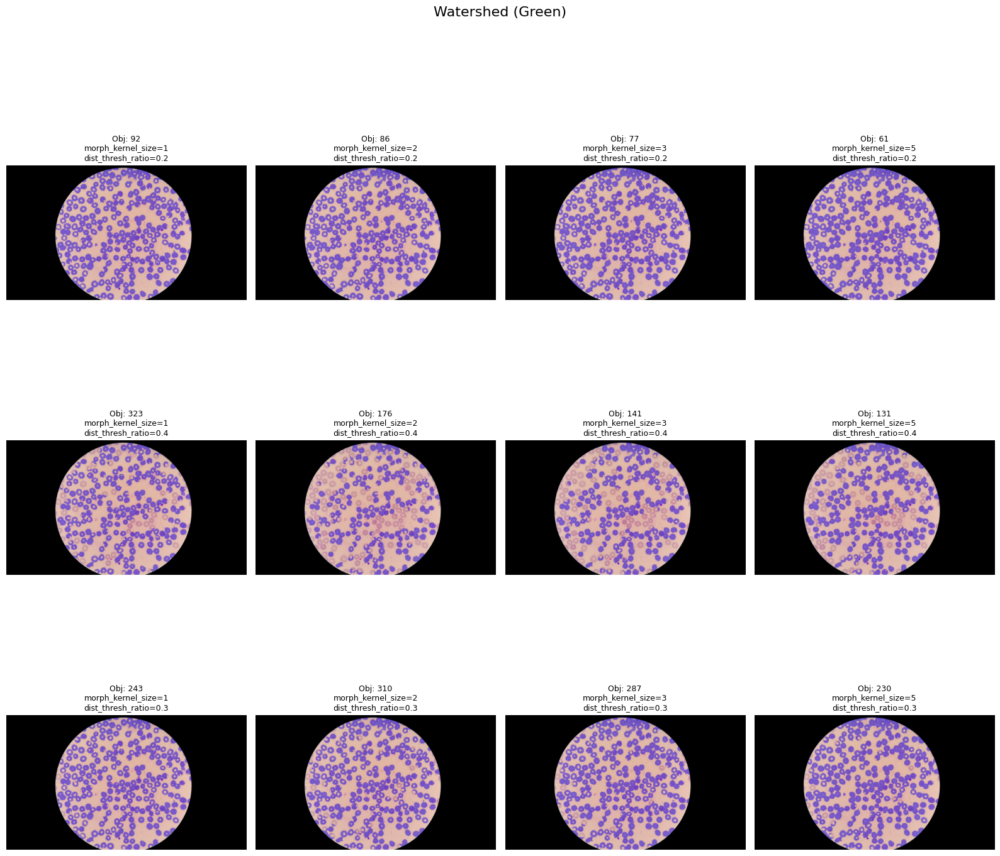

In [124]:
water_grid = [
    {"morph_kernel_size": 1, "dist_thresh_ratio": 0.2}, 
    {"morph_kernel_size": 2, "dist_thresh_ratio": 0.2},
    {"morph_kernel_size": 3, "dist_thresh_ratio": 0.2}, 
    {"morph_kernel_size": 5, "dist_thresh_ratio": 0.2},
    {"morph_kernel_size": 1, "dist_thresh_ratio": 0.4}, 
    {"morph_kernel_size": 2, "dist_thresh_ratio": 0.4},
    {"morph_kernel_size": 3, "dist_thresh_ratio": 0.4}, 
    {"morph_kernel_size": 5, "dist_thresh_ratio": 0.4},
    {"morph_kernel_size": 1, "dist_thresh_ratio": 0.3}, 
    {"morph_kernel_size": 2, "dist_thresh_ratio": 0.3},
    {"morph_kernel_size": 3, "dist_thresh_ratio": 0.3}, 
    {"morph_kernel_size": 5, "dist_thresh_ratio": 0.3},
]
visualize_grid(img_green, rgb, segment_watershed, water_grid, "Watershed (Green)")

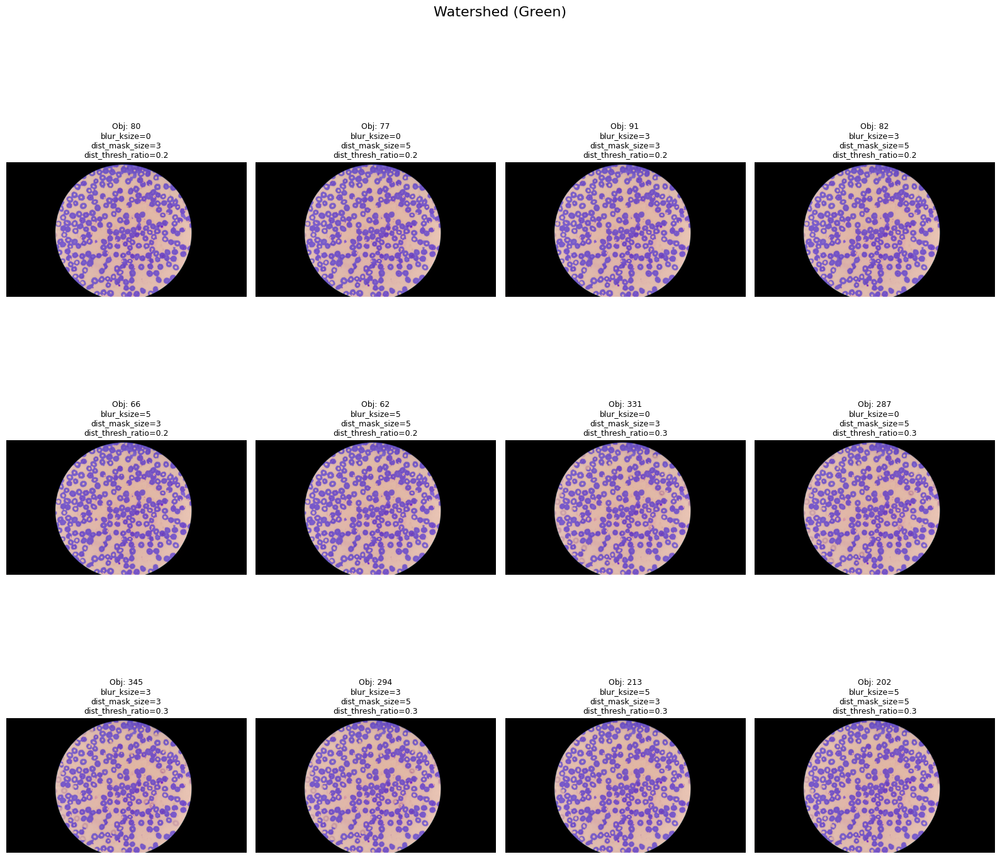

In [125]:
water_grid = [
    {"blur_ksize": 0, "dist_mask_size": 3, "dist_thresh_ratio": 0.2},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.2},
    {"blur_ksize": 3, "dist_mask_size": 3, "dist_thresh_ratio": 0.2},
    {"blur_ksize": 3, "dist_mask_size": 5, "dist_thresh_ratio": 0.2},
    {"blur_ksize": 5, "dist_mask_size": 3, "dist_thresh_ratio": 0.2},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.2},
    {"blur_ksize": 0, "dist_mask_size": 3, "dist_thresh_ratio": 0.3},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.3},
    {"blur_ksize": 3, "dist_mask_size": 3, "dist_thresh_ratio": 0.3},
    {"blur_ksize": 3, "dist_mask_size": 5, "dist_thresh_ratio": 0.3},
    {"blur_ksize": 5, "dist_mask_size": 3, "dist_thresh_ratio": 0.3},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.3},
]
visualize_grid(img_green, rgb, segment_watershed, water_grid, "Watershed (Green)")

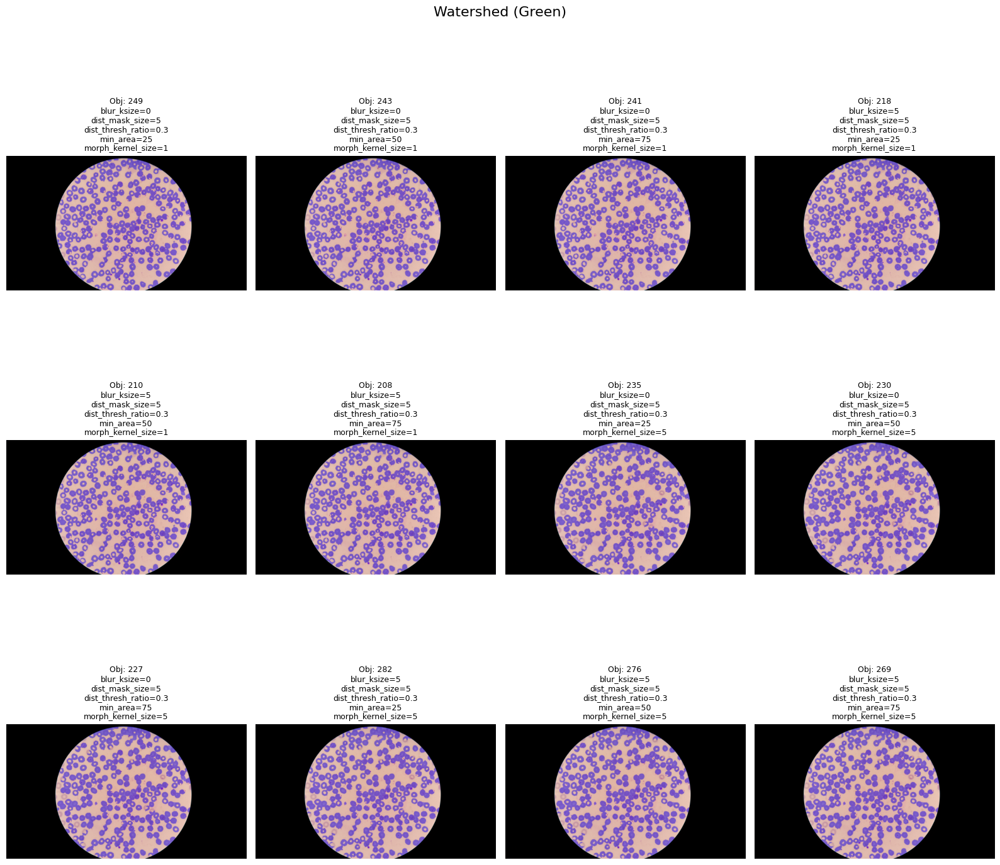

In [126]:
water_grid = [
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 25, "morph_kernel_size": 1},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 50, "morph_kernel_size": 1},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 75, "morph_kernel_size": 1},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 25, "morph_kernel_size": 1},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 50, "morph_kernel_size": 1},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 75, "morph_kernel_size": 1},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 25, "morph_kernel_size": 5},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 50, "morph_kernel_size": 5},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 75, "morph_kernel_size": 5},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 25, "morph_kernel_size": 5},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 50, "morph_kernel_size": 5},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.3, "min_area": 75, "morph_kernel_size": 5},
]
visualize_grid(img_green, rgb, segment_watershed, water_grid, "Watershed (Green)")

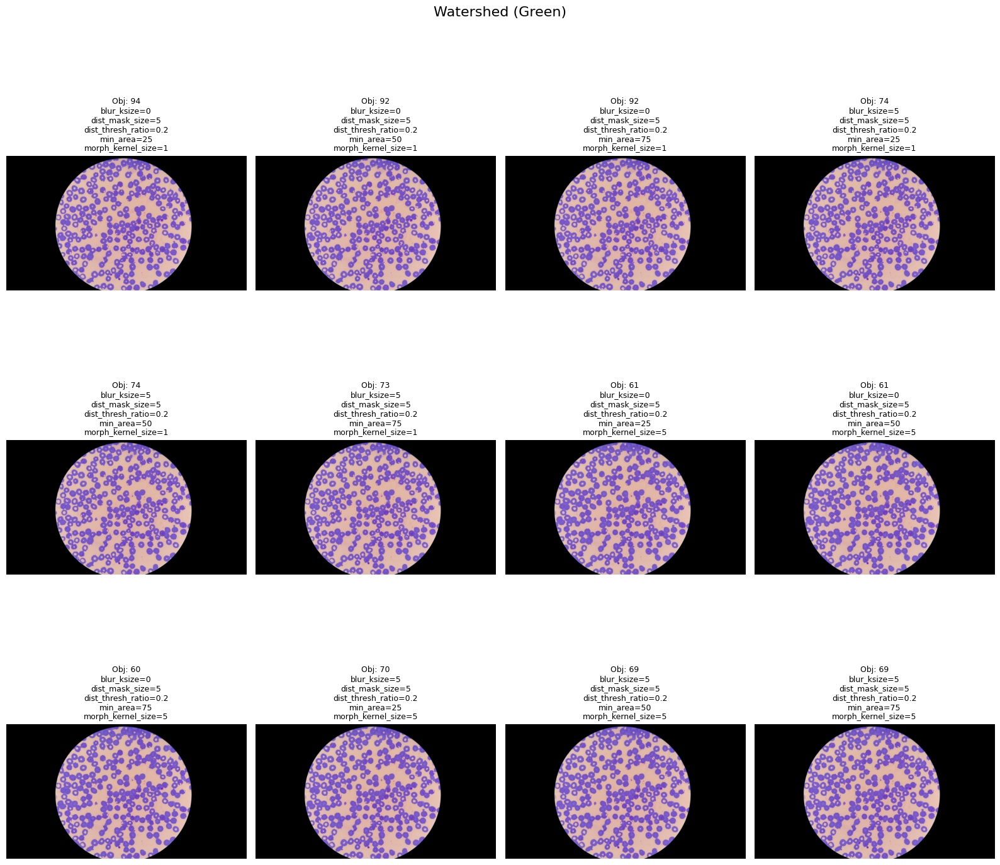

In [127]:
water_grid = [
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 25, "morph_kernel_size": 1},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 50, "morph_kernel_size": 1},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 75, "morph_kernel_size": 1},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 25, "morph_kernel_size": 1},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 50, "morph_kernel_size": 1},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 75, "morph_kernel_size": 1},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 25, "morph_kernel_size": 5},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 50, "morph_kernel_size": 5},
    {"blur_ksize": 0, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 75, "morph_kernel_size": 5},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 25, "morph_kernel_size": 5},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 50, "morph_kernel_size": 5},
    {"blur_ksize": 5, "dist_mask_size": 5, "dist_thresh_ratio": 0.2, "min_area": 75, "morph_kernel_size": 5},
]
visualize_grid(img_green, rgb, segment_watershed, water_grid, "Watershed (Green)")

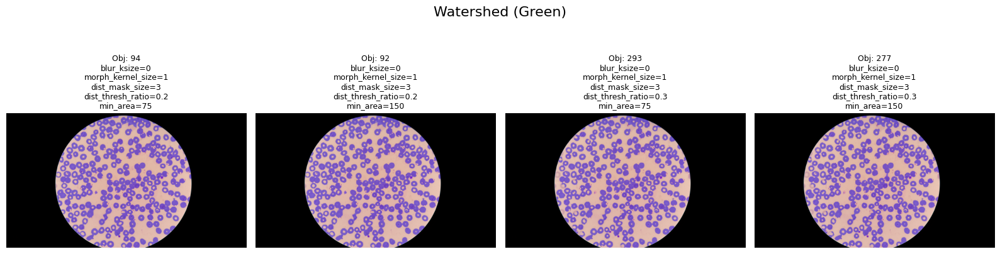

In [129]:
water_grid = [
    {"blur_ksize": 0, "morph_kernel_size": 1, "dist_mask_size": 3, "dist_thresh_ratio": 0.2, "min_area": 75},
    {"blur_ksize": 0, "morph_kernel_size": 1, "dist_mask_size": 3, "dist_thresh_ratio": 0.2, "min_area": 150},
    {"blur_ksize": 0, "morph_kernel_size": 1, "dist_mask_size": 3, "dist_thresh_ratio": 0.3, "min_area": 75},
    {"blur_ksize": 0, "morph_kernel_size": 1, "dist_mask_size": 3, "dist_thresh_ratio": 0.3, "min_area": 150},
]
visualize_grid(img_green, rgb, segment_watershed, water_grid, "Watershed (Green)")

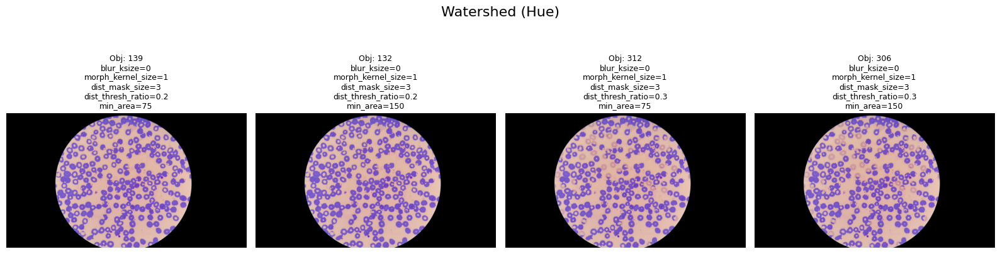

In [146]:
visualize_grid(img_hue, rgb, segment_watershed, water_grid, "Watershed (Hue)")

## Hough Grid

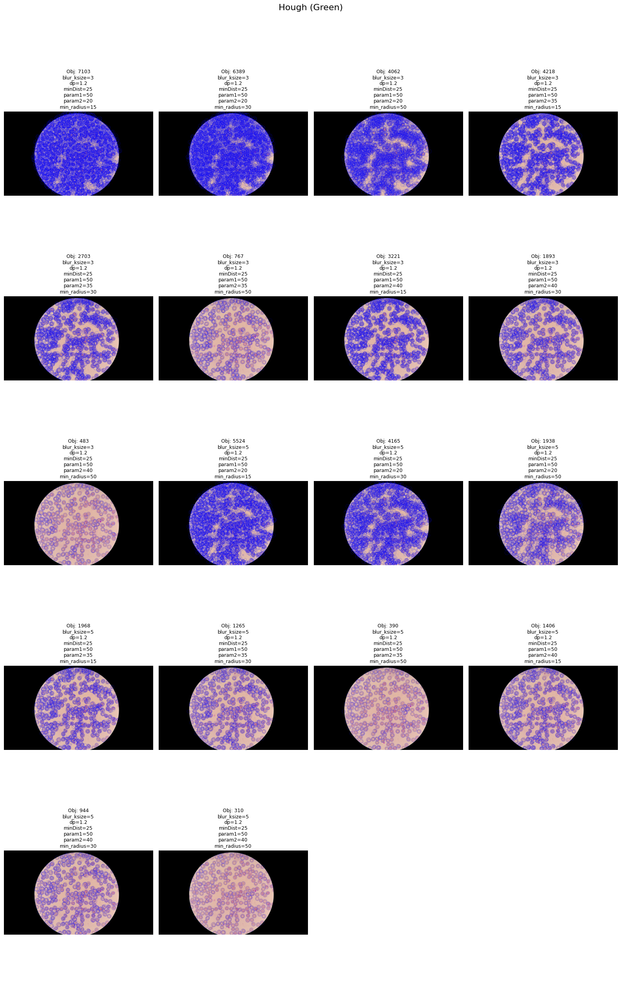

In [9]:
hough_grid = []

for blur in [3, 5]:
    for p2 in [20,35, 40 ]:
        for r in [15, 30, 50]:
            hough_grid.append({
                "blur_ksize": blur,
                "dp": 1.2,
                "minDist": 25, 
                "param1": 50,
                "param2": p2,
                "min_radius": r
            })
visualize_grid(img_green, rgb, segment_hough, hough_grid, "Hough (Green)")


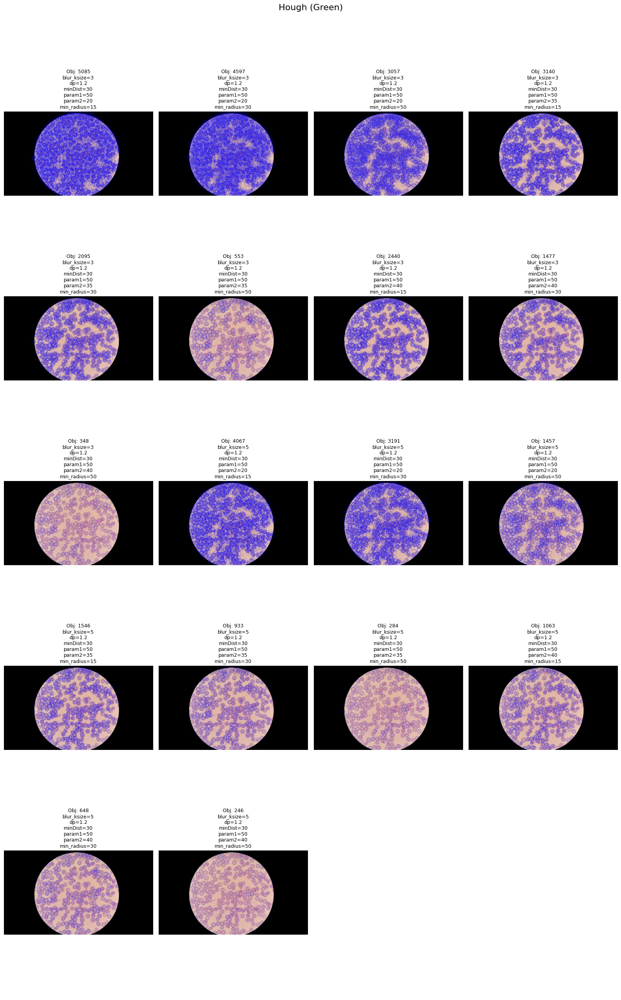

In [13]:
hough_grid = []

for blur in [3, 5]:
    for p2 in [20, 35, 40 ]:
        for r in [15, 30, 50]:
            hough_grid.append({
                "blur_ksize": blur,
                "dp": 1.2,
                "minDist": 30, 
                "param1": 50,
                "param2": p2,
                "min_radius": r
            })
visualize_grid(img_green, rgb, segment_hough, hough_grid, "Hough (Green)")

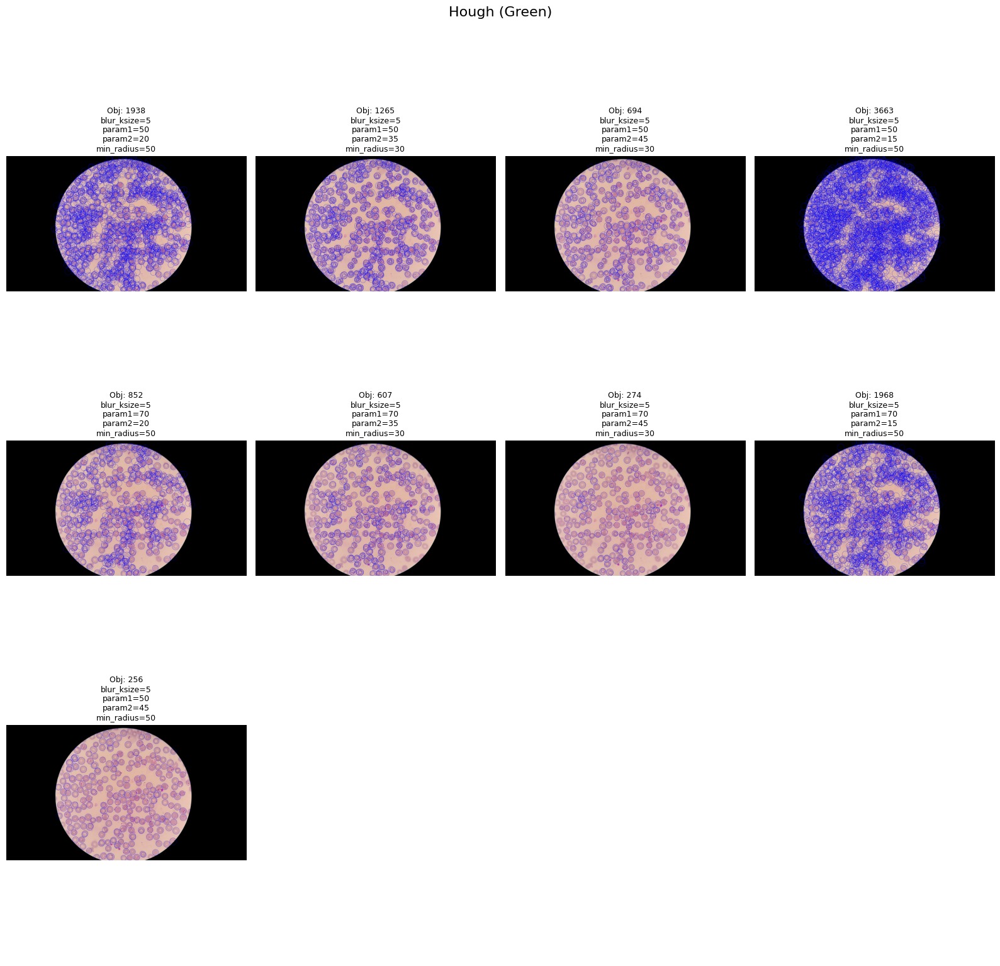

In [12]:
hough_grid = [
    {"blur_ksize": 5, "param1": 50, "param2": 20, "min_radius": 50}, 
    {"blur_ksize": 5, "param1": 50, "param2": 35, "min_radius": 30}, 
    {"blur_ksize": 5, "param1": 50, "param2": 45, "min_radius": 30}, 
    {"blur_ksize": 5, "param1": 50, "param2": 15, "min_radius": 50},
    {"blur_ksize": 5, "param1": 70, "param2": 20, "min_radius": 50}, 
    {"blur_ksize": 5, "param1": 70, "param2": 35, "min_radius": 30}, 
    {"blur_ksize": 5, "param1": 70, "param2": 45, "min_radius": 30}, 
    {"blur_ksize": 5, "param1": 70, "param2": 15, "min_radius": 50},
    {"blur_ksize": 5, "param1": 50, "param2": 45, "min_radius": 50}  
]
visualize_grid(img_green, rgb, segment_hough, hough_grid, "Hough (Green)")

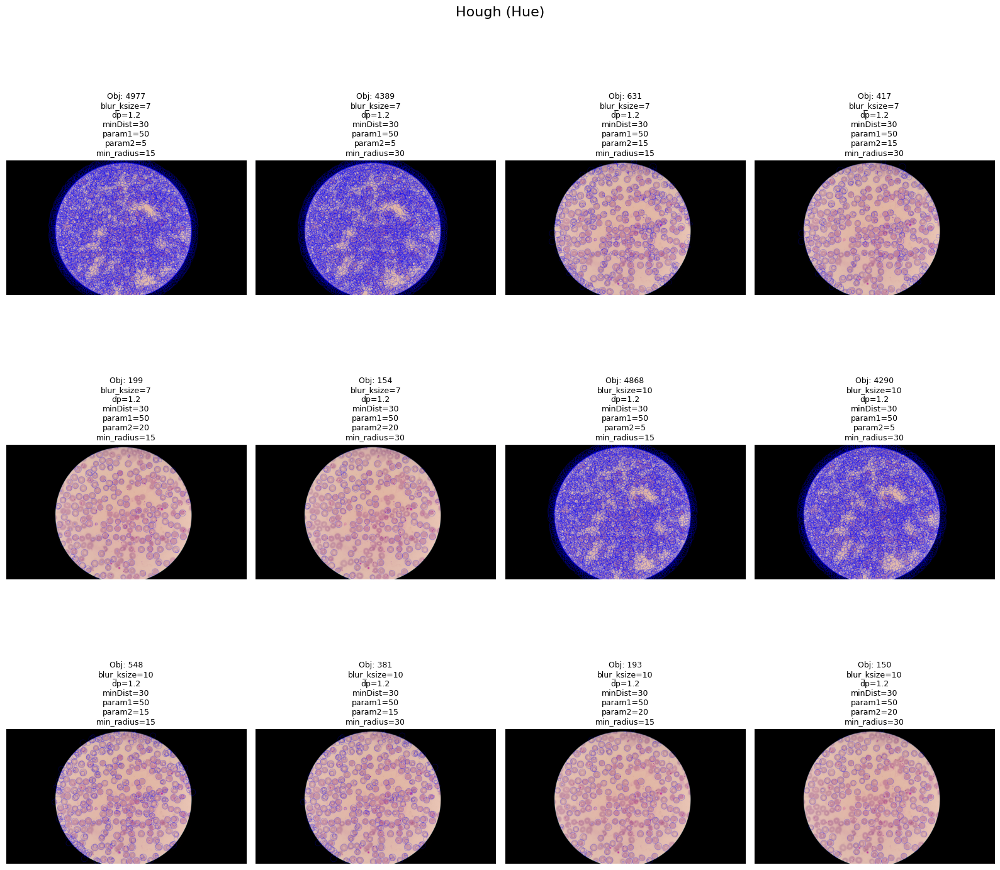

In [14]:
hough_grid = []

for blur in [7, 10]:
    for p2 in [5, 15, 20]:
        for r in [15, 30]:
            hough_grid.append({
                "blur_ksize": blur,
                "dp": 1.2,
                "minDist": 30, 
                "param1": 50,
                "param2": p2,
                "min_radius": r
            })
visualize_grid(img_hue, rgb, segment_hough, hough_grid, "Hough (Hue)")

## Otsu Grid

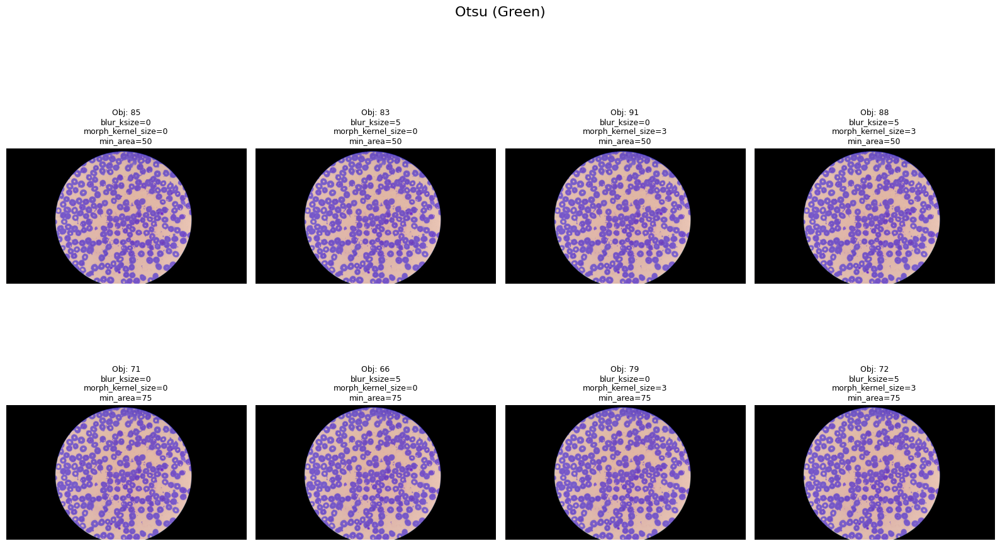

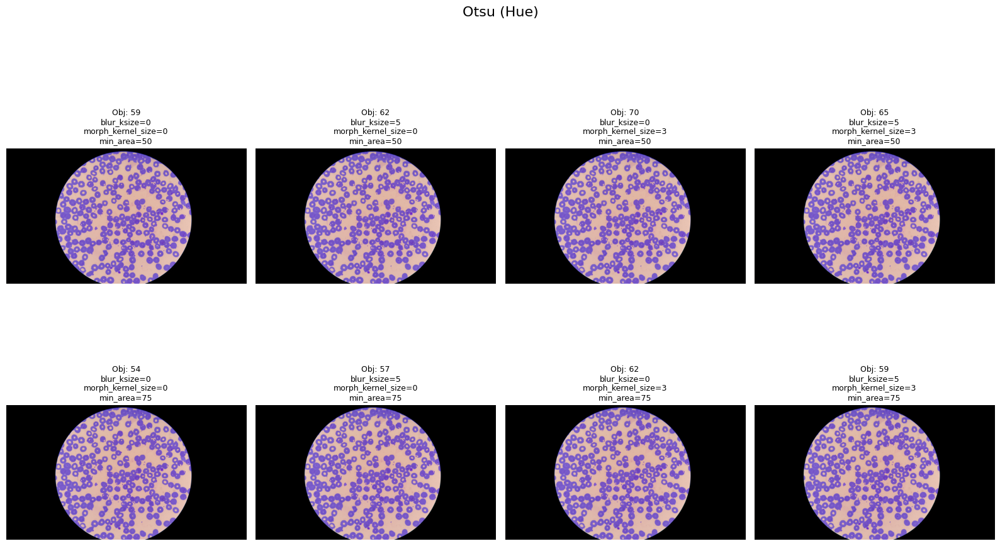

In [147]:
otsu_grid = [
    {"blur_ksize": 0, "morph_kernel_size": 0, "min_area": 50}, 
    {"blur_ksize": 5, "morph_kernel_size": 0, "min_area": 50}, 
    {"blur_ksize": 0, "morph_kernel_size": 3, "min_area": 50}, 
    {"blur_ksize": 5, "morph_kernel_size": 3, "min_area": 50},
    {"blur_ksize": 0, "morph_kernel_size": 0, "min_area": 75}, 
    {"blur_ksize": 5, "morph_kernel_size": 0, "min_area": 75}, 
    {"blur_ksize": 0, "morph_kernel_size": 3, "min_area": 75}, 
    {"blur_ksize": 5, "morph_kernel_size": 3, "min_area": 75},
]

visualize_grid(img_green, rgb, segment_otsu, otsu_grid, "Otsu (Green)")
visualize_grid(img_hue, rgb, segment_otsu, otsu_grid, "Otsu (Hue)")